The TL;DR of this notebook is using an image classifier to classify frames from youtube videos. At the point of doing this project, the training was taking a long time and so the model likely needs more than 25 epochs to be more accurate. This notebook demonstrates my skills in image classification machine learning, utilising public datasets and modifying existing image classifier architecture. 


In [ ]:
#Importing modules
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

In [ ]:
##MODEL DEVELOPMENT

In [ ]:
#importing dataset
import pathlib
dataset_url = "https://zenodo.org/record/832380/files/train.tar.gz"
data_dir = tf.keras.utils.get_file('train', origin=dataset_url, untar=True)
data_dir = pathlib.Path(data_dir)

In [ ]:
#setting sizes
batch_size = 32
img_height = 180
img_width = 180

In [ ]:
#setting aside 80% of images for training
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 2404 files belonging to 4 classes.
Using 1924 files for training.


In [ ]:
#setting aside 80% of images for validation
val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 2404 files belonging to 4 classes.
Using 480 files for validation.


In [ ]:
#setting names for classes for classification
class_names = train_ds.class_names
print(class_names)

['handshake', 'highfive', 'hug', 'kiss']


In [ ]:
#improves model performance
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [ ]:
#data is now standardised
normalization_layer = layers.Rescaling(1./255)

In [ ]:
#creates slightly different copies of training dataset to increase amount of data for training
#and helpfully improve model
data_augmentation = keras.Sequential(
  [
    layers.RandomFlip("horizontal",
                      input_shape=(img_height,
                                  img_width,
                                  3)),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
  ]
)

In [ ]:
#the model itself
num_classes = len(class_names)

model = Sequential([
  data_augmentation,
  layers.Rescaling(1./255),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout(0.2),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

In [ ]:
#compiling model
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
#training model
epochs = 25
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/25
61/61 [==============================] - 25s 90ms/step - loss: 1.3805 - accuracy: 0.3082 - val_loss: 1.3686 - val_accuracy: 0.3187
Epoch 2/25
61/61 [==============================] - 3s 53ms/step - loss: 1.3094 - accuracy: 0.3597 - val_loss: 1.3970 - val_accuracy: 0.3521
Epoch 3/25
61/61 [==============================] - 3s 51ms/step - loss: 1.2724 - accuracy: 0.4018 - val_loss: 1.3090 - val_accuracy: 0.4062
Epoch 4/25
61/61 [==============================] - 3s 51ms/step - loss: 1.2434 - accuracy: 0.4184 - val_loss: 1.3125 - val_accuracy: 0.3771
Epoch 5/25
61/61 [==============================] - 3s 51ms/step - loss: 1.2151 - accuracy: 0.4376 - val_loss: 1.2759 - val_accuracy: 0.4187
Epoch 6/25
61/61 [==============================] - 3s 51ms/step - loss: 1.2052 - accuracy: 0.4615 - val_loss: 1.3572 - val_accuracy: 0.3688
Epoch 7/25
61/61 [==============================] - 3s 51ms/step - loss: 1.1582 - accuracy: 0.4870 - val_loss: 1.2737 - val_accuracy: 0.4313
Epoch 8/25
6

In [ ]:
## YOUTUBE DOWNLOADS AND IMAGES AND SO ON BELOW 

In [ ]:
youtube_list_bolly = [
                "https://www.youtube.com/watch?v=WiMIxwX4MjI", #Jab We Met, Bollywood Movie 
                #"https://www.youtube.com/watch?v=Rbp2XUSeUNE", #Yeh Jawani Hai Deewani Bollywood Movie
                "https://www.youtube.com/watch?v=cmax1C1p660", #Dilwale Dulhania Le Jayenge Bollywood Movie
                "https://www.youtube.com/watch?v=OtGzATlvw_0" #Kuch Kuch Hota Hai 
]
youtube_list_holly = [
                      "https://www.youtube.com/watch?v=ZQ-YX-5bAs0", #Crazy Rich Asians
                      #"https://www.youtube.com/watch?v=F6QrNMNPYus", #The Best Man #age restricted
                      "https://www.youtube.com/watch?v=KlZ4fYqjGJI", #Breakfast at Tiffanys
                      "https://www.youtube.com/watch?v=dZmrMJmAfF0" #My Big Fat Greek Wedding
]
youtube_list_lgbtq = [
                      "https://www.youtube.com/watch?v=78h8WeP3Oas", #Saving Face
                      "https://www.youtube.com/watch?v=gCIGwgntcD8", #Kiss Me Swedish Movie
                      "https://www.youtube.com/watch?v=yLJe1QakzX4", #Were The World Mine 
                      #"https://www.youtube.com/watch?v=ykHeGtN4m94" #Love Simon
]
youtube_list_total = youtube_list_bolly + youtube_list_holly + youtube_list_lgbtq
#reduced number to 9 movies so data processing is reduced and labelling of folders is easier to understand

In [ ]:
#youtube downloader
!sudo curl -L https://yt-dl.org/downloads/latest/youtube-dl -o /usr/local/bin/youtube-dl
!sudo chmod a+rx /usr/local/bin/youtube-dl

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100     3  100     3    0     0     15      0 --:--:-- --:--:-- --:--:--    15
100     3  100     3    0     0     14      0 --:--:-- --:--:-- --:--:--    14
100   645  100   645    0     0   1666      0 --:--:-- --:--:-- --:--:--  1666
100 1794k  100 1794k    0     0  2871k      0 --:--:-- --:--:-- --:--:-- 2871k


In [ ]:
#youtube video to image maker
#iterated to make a separate folder per video
file_type = ".jpg"
paths = []
a = 0
youtube_url = youtube_list_total[0]
for y in youtube_list_total:
  youtube_url = y
  a = a + 1

  !youtube-dl -f 133 $youtube_url -o 'youtube_dataset{a}.mp4' #133 selected due to lowest res above 180,180
  fps = 1 
  !mkdir video_frames'{a}'
  !ffmpeg -i $"youtube_dataset{a}.mp4" -vf fps=$fps video_frames'{a}'/%04d.jpg
  


[youtube] WiMIxwX4MjI: Downloading webpage
[download] Destination: youtube_dataset1.mp4
[download] 100% of 1.37MiB in 00:20
ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-li

In [ ]:
## IMAGE DISPLAY

In [ ]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array


In [ ]:
#image path folder names stored in list
path_to_images = [
 '/content/video_frames1/',
 '/content/video_frames2/',
 '/content/video_frames3/',
 '/content/video_frames4/',
 '/content/video_frames5/',
 '/content/video_frames6/',
 '/content/video_frames7/',
 '/content/video_frames8/',
 '/content/video_frames9/'
 ]

In [ ]:
#images path direct stored in list
for p in path_to_images:
  for root, dirs, files in os.walk(p, topdown=False):
      for name in files:
          if file_type in name.lower():
              paths.append(str(os.path.join(root, name)))


In [ ]:
paths 

['/content/video_frames1/0027.jpg',
 '/content/video_frames1/0031.jpg',
 '/content/video_frames1/0022.jpg',
 '/content/video_frames1/0024.jpg',
 '/content/video_frames1/0010.jpg',
 '/content/video_frames1/0006.jpg',
 '/content/video_frames1/0049.jpg',
 '/content/video_frames1/0035.jpg',
 '/content/video_frames1/0052.jpg',
 '/content/video_frames1/0015.jpg',
 '/content/video_frames1/0004.jpg',
 '/content/video_frames1/0021.jpg',
 '/content/video_frames1/0034.jpg',
 '/content/video_frames1/0025.jpg',
 '/content/video_frames1/0007.jpg',
 '/content/video_frames1/0005.jpg',
 '/content/video_frames1/0046.jpg',
 '/content/video_frames1/0011.jpg',
 '/content/video_frames1/0051.jpg',
 '/content/video_frames1/0050.jpg',
 '/content/video_frames1/0054.jpg',
 '/content/video_frames1/0028.jpg',
 '/content/video_frames1/0020.jpg',
 '/content/video_frames1/0042.jpg',
 '/content/video_frames1/0013.jpg',
 '/content/video_frames1/0029.jpg',
 '/content/video_frames1/0040.jpg',
 '/content/video_frames1/001

In [ ]:
#resizes images and stores in array
dataset = [np.array(img_to_array(load_img(i,target_size=((img_height,img_width)))))/255.0 for i in paths]
dataset = np.array(dataset).astype("float32")
dataset.shape
#can tell you about how many images there and their shape and channels (rgb or otherwise)

(1011, 180, 180, 3)

In [ ]:
from PIL import Image
#used to display images

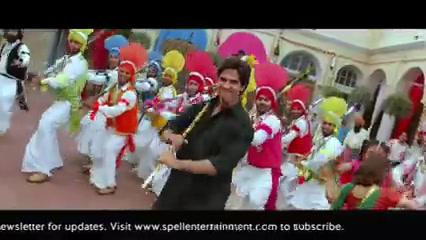

The above image most likely belongs to highfive with a 78.20 percent confidence.


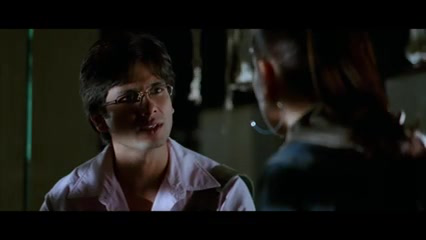

The above image most likely belongs to highfive with a 83.53 percent confidence.


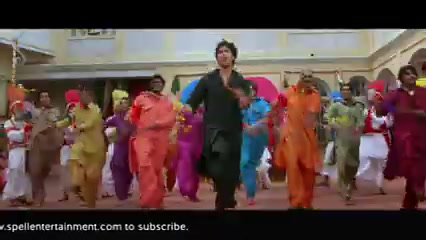

The above image most likely belongs to highfive with a 70.96 percent confidence.


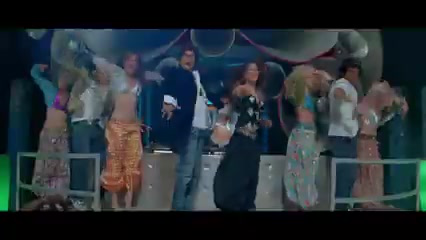

The above image most likely belongs to highfive with a 71.26 percent confidence.


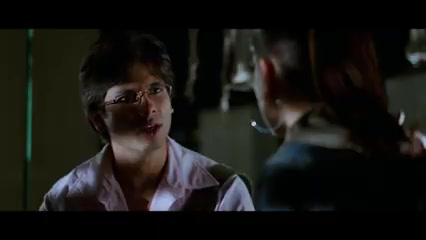

The above image most likely belongs to highfive with a 79.80 percent confidence.


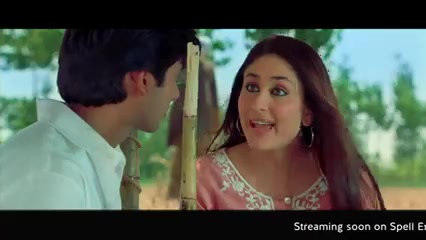

The above image most likely belongs to kiss with a 77.41 percent confidence.


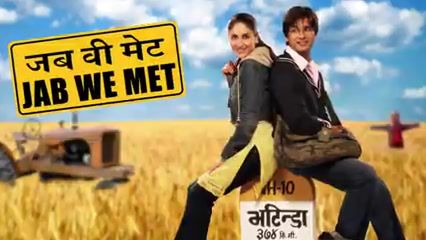

The above image most likely belongs to highfive with a 78.90 percent confidence.


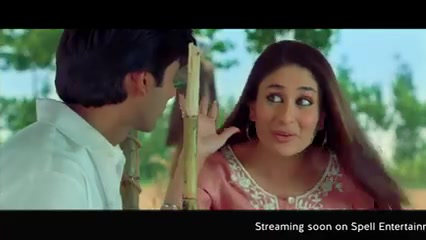

The above image most likely belongs to highfive with a 70.66 percent confidence.


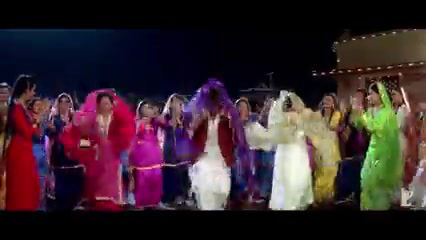

The above image most likely belongs to highfive with a 80.31 percent confidence.


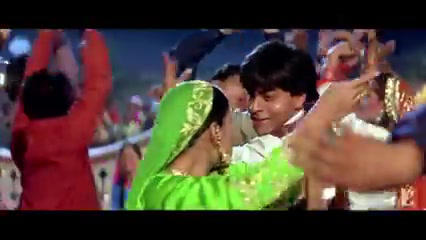

The above image most likely belongs to highfive with a 88.56 percent confidence.


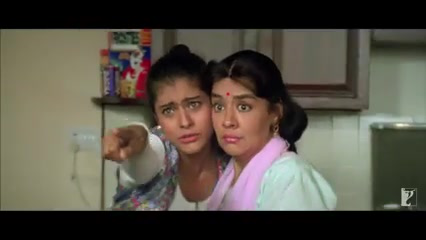

The above image most likely belongs to hug with a 72.36 percent confidence.


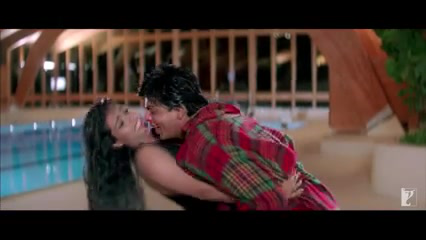

The above image most likely belongs to highfive with a 74.17 percent confidence.


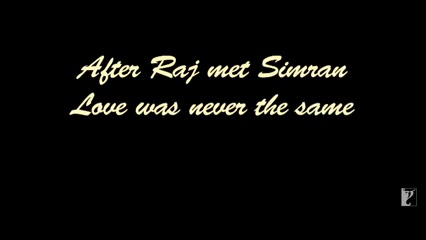

The above image most likely belongs to highfive with a 89.33 percent confidence.


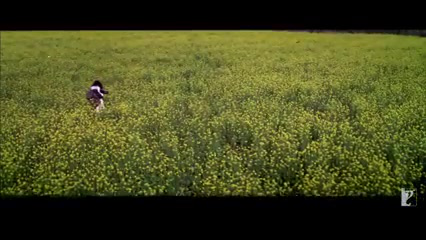

The above image most likely belongs to kiss with a 75.27 percent confidence.


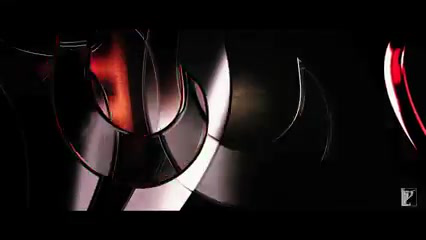

The above image most likely belongs to highfive with a 84.78 percent confidence.


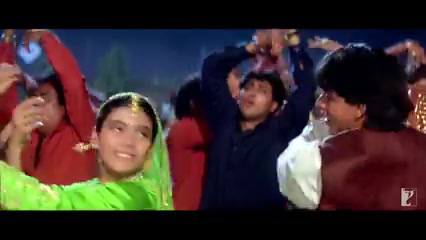

The above image most likely belongs to highfive with a 76.15 percent confidence.


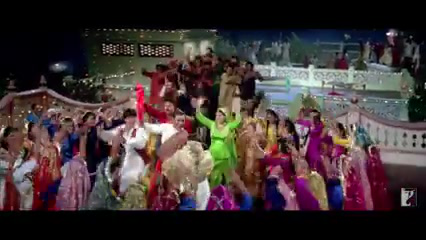

The above image most likely belongs to highfive with a 70.01 percent confidence.


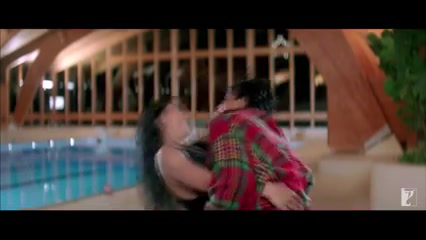

The above image most likely belongs to highfive with a 79.19 percent confidence.


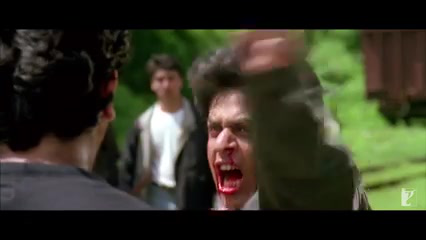

The above image most likely belongs to kiss with a 70.59 percent confidence.


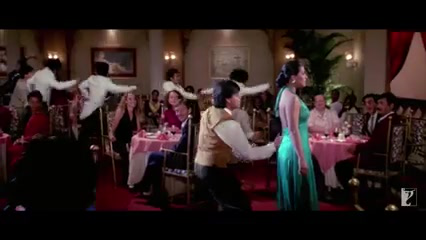

The above image most likely belongs to highfive with a 86.75 percent confidence.


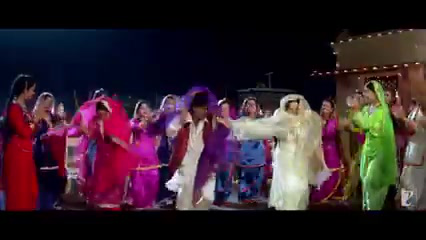

The above image most likely belongs to highfive with a 70.32 percent confidence.


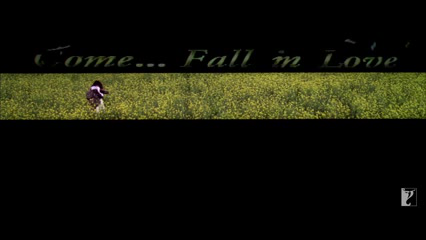

The above image most likely belongs to kiss with a 71.62 percent confidence.


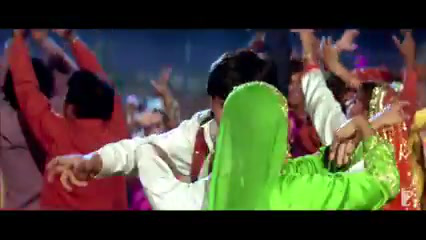

The above image most likely belongs to highfive with a 95.44 percent confidence.


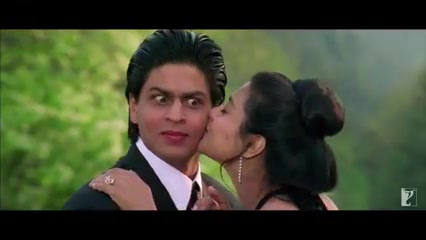

The above image most likely belongs to kiss with a 96.23 percent confidence.


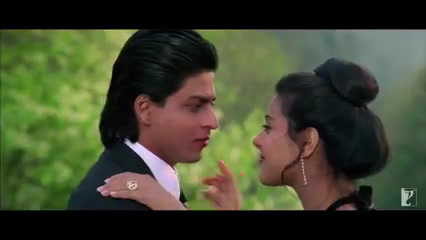

The above image most likely belongs to kiss with a 94.32 percent confidence.


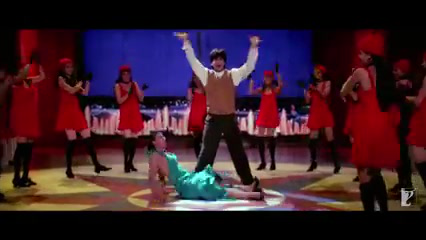

The above image most likely belongs to highfive with a 71.29 percent confidence.


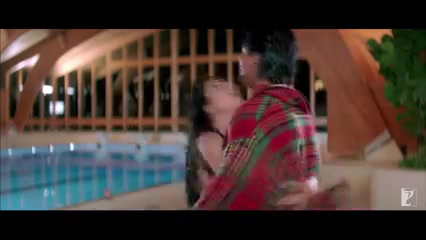

The above image most likely belongs to highfive with a 74.68 percent confidence.


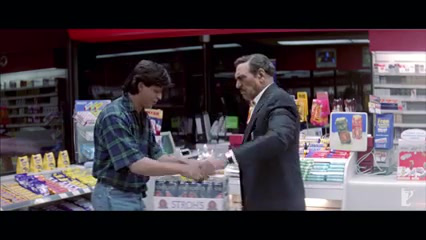

The above image most likely belongs to highfive with a 80.41 percent confidence.


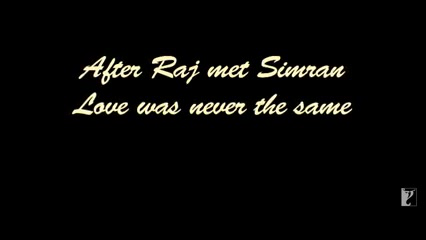

The above image most likely belongs to highfive with a 83.60 percent confidence.


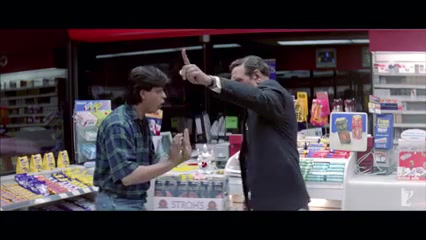

The above image most likely belongs to highfive with a 80.34 percent confidence.


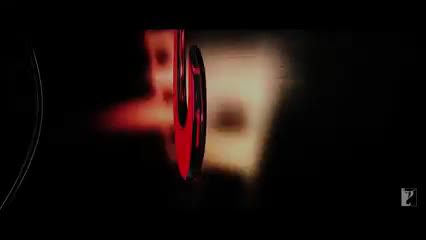

The above image most likely belongs to kiss with a 95.73 percent confidence.


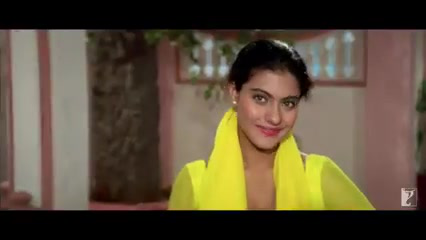

The above image most likely belongs to highfive with a 79.18 percent confidence.


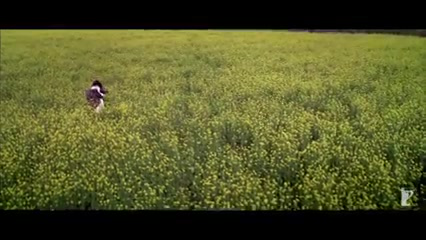

The above image most likely belongs to kiss with a 73.93 percent confidence.


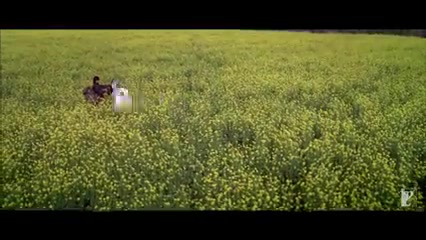

The above image most likely belongs to kiss with a 75.23 percent confidence.


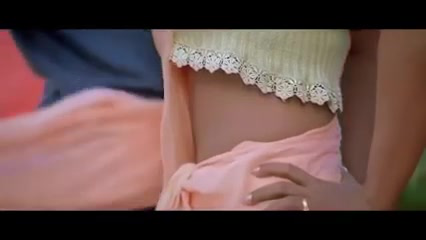

The above image most likely belongs to kiss with a 77.57 percent confidence.


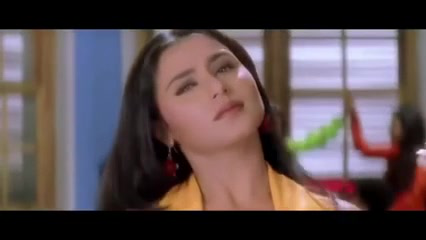

The above image most likely belongs to hug with a 80.57 percent confidence.


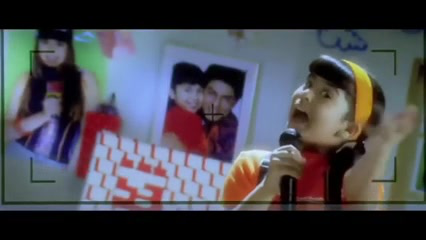

The above image most likely belongs to highfive with a 75.04 percent confidence.


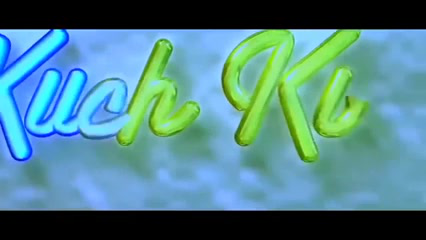

The above image most likely belongs to highfive with a 99.23 percent confidence.


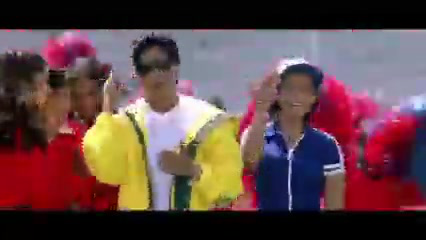

The above image most likely belongs to highfive with a 71.52 percent confidence.


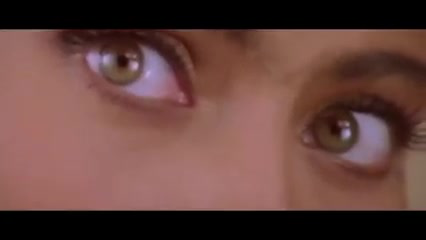

The above image most likely belongs to kiss with a 72.98 percent confidence.


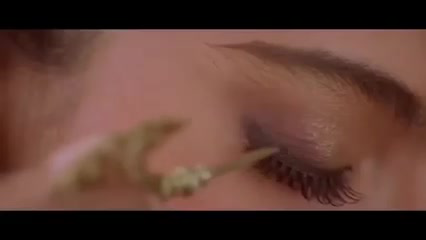

The above image most likely belongs to kiss with a 71.19 percent confidence.


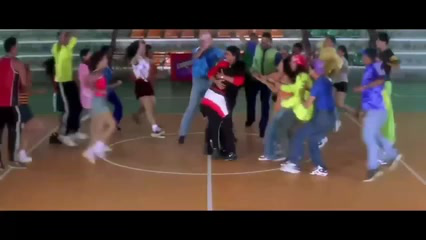

The above image most likely belongs to highfive with a 79.39 percent confidence.


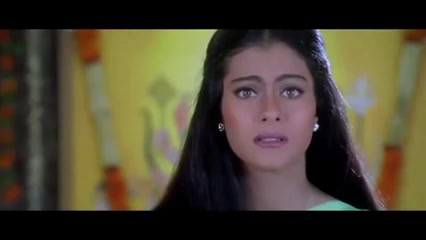

The above image most likely belongs to kiss with a 75.21 percent confidence.


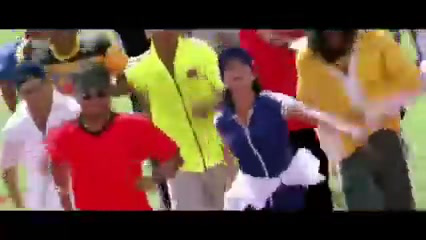

The above image most likely belongs to highfive with a 86.94 percent confidence.


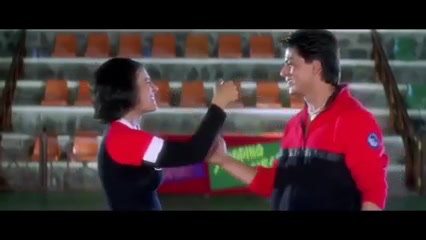

The above image most likely belongs to handshake with a 78.84 percent confidence.


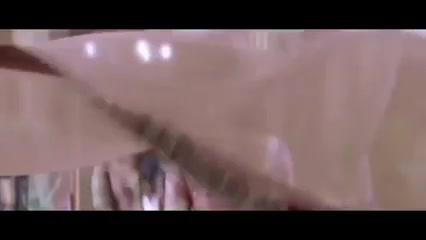

The above image most likely belongs to kiss with a 76.32 percent confidence.


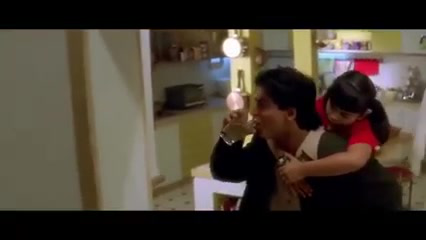

The above image most likely belongs to highfive with a 77.16 percent confidence.


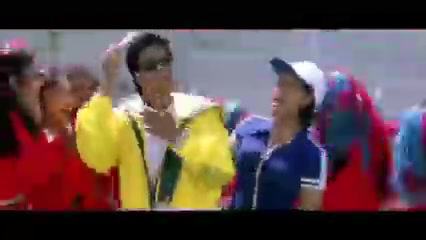

The above image most likely belongs to highfive with a 85.19 percent confidence.


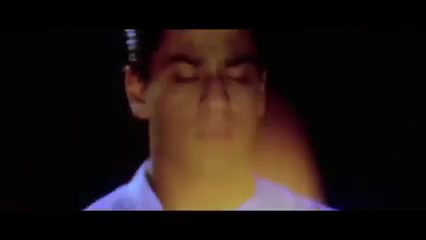

The above image most likely belongs to kiss with a 78.04 percent confidence.


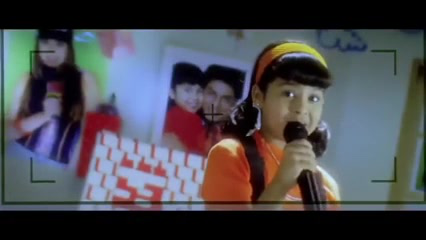

The above image most likely belongs to highfive with a 74.92 percent confidence.


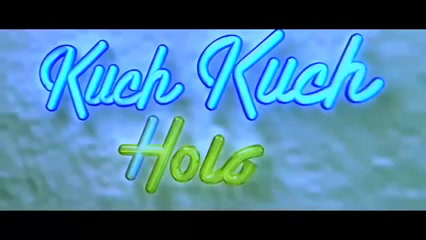

The above image most likely belongs to highfive with a 98.66 percent confidence.


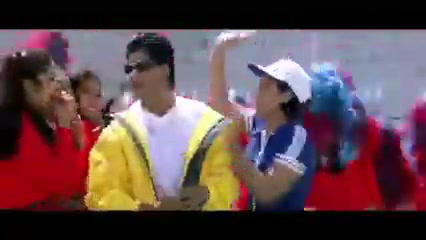

The above image most likely belongs to highfive with a 74.31 percent confidence.


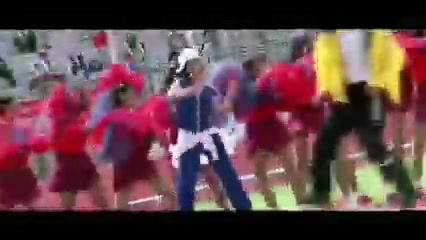

The above image most likely belongs to handshake with a 71.83 percent confidence.


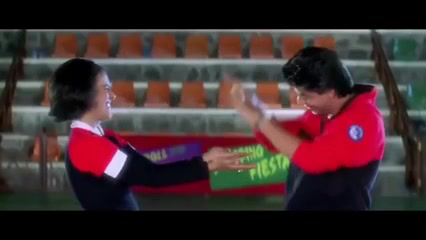

The above image most likely belongs to handshake with a 84.79 percent confidence.


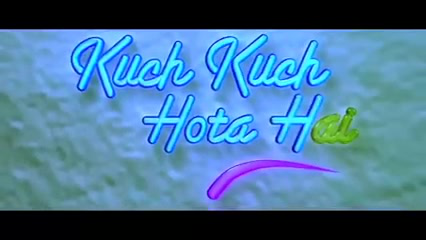

The above image most likely belongs to highfive with a 85.80 percent confidence.


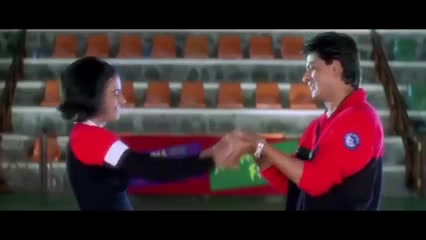

The above image most likely belongs to handshake with a 87.94 percent confidence.


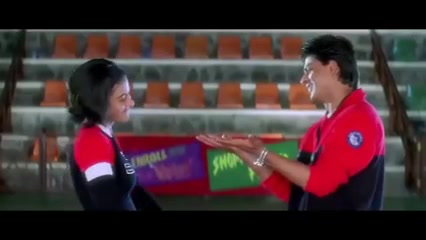

The above image most likely belongs to handshake with a 86.83 percent confidence.


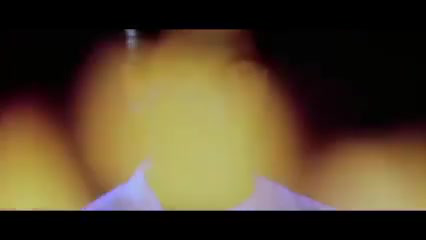

The above image most likely belongs to kiss with a 83.67 percent confidence.


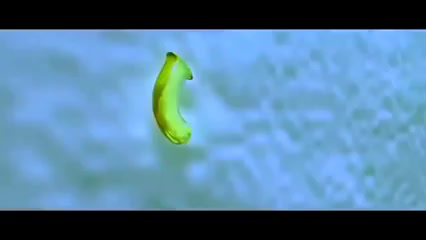

The above image most likely belongs to highfive with a 88.59 percent confidence.


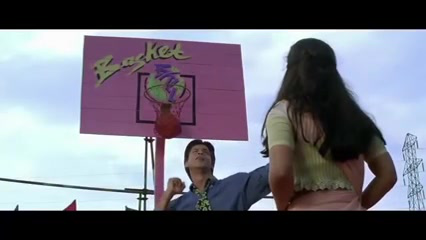

The above image most likely belongs to handshake with a 80.52 percent confidence.


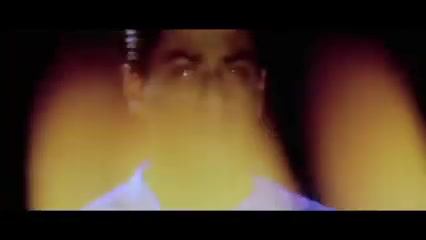

The above image most likely belongs to kiss with a 78.94 percent confidence.


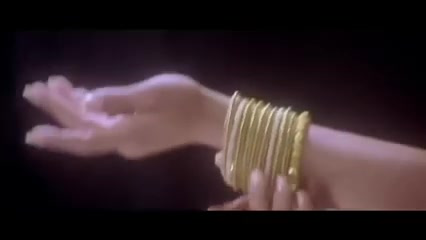

The above image most likely belongs to kiss with a 77.41 percent confidence.


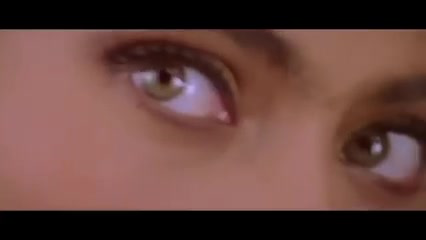

The above image most likely belongs to kiss with a 72.53 percent confidence.


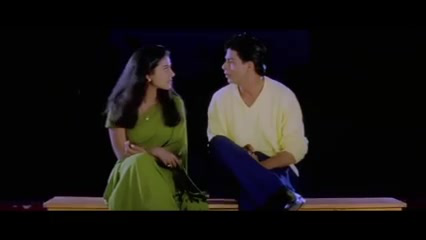

The above image most likely belongs to highfive with a 75.60 percent confidence.


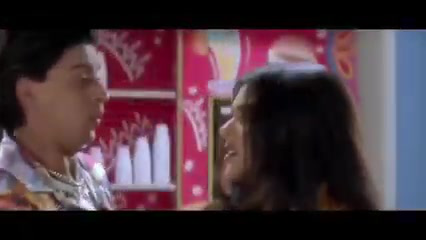

The above image most likely belongs to highfive with a 74.48 percent confidence.


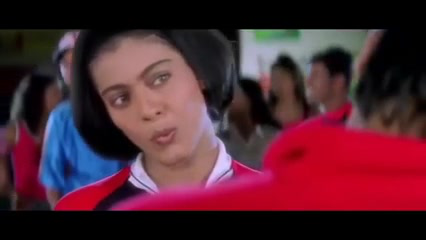

The above image most likely belongs to kiss with a 77.13 percent confidence.


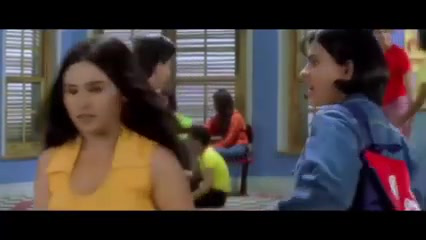

The above image most likely belongs to highfive with a 71.71 percent confidence.


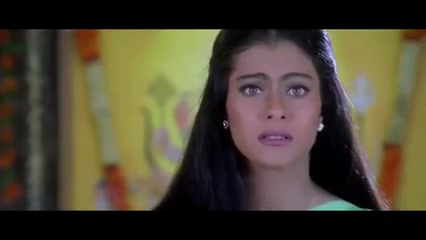

The above image most likely belongs to kiss with a 81.35 percent confidence.


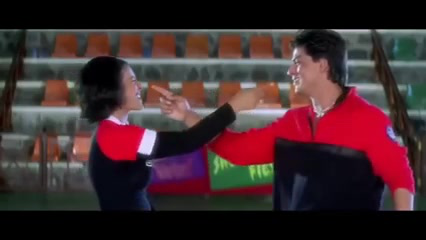

The above image most likely belongs to handshake with a 84.55 percent confidence.


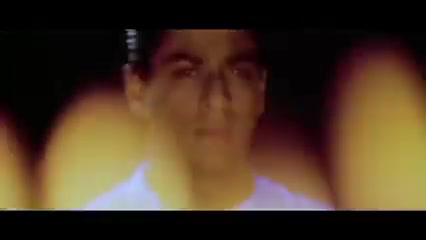

The above image most likely belongs to kiss with a 75.08 percent confidence.


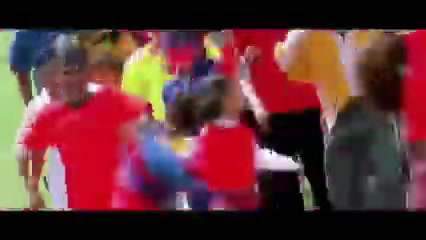

The above image most likely belongs to highfive with a 75.17 percent confidence.


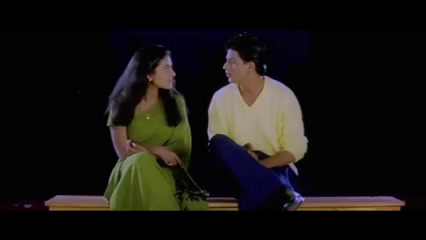

The above image most likely belongs to highfive with a 77.53 percent confidence.


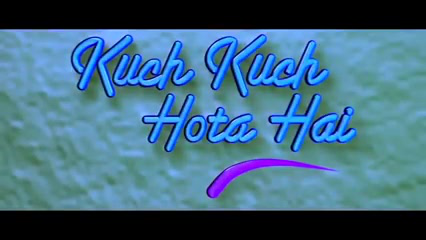

The above image most likely belongs to highfive with a 87.10 percent confidence.


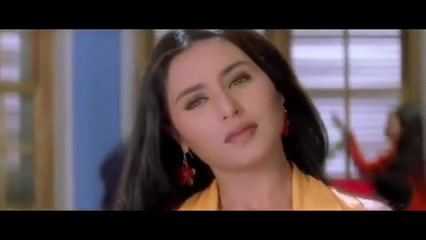

The above image most likely belongs to hug with a 78.71 percent confidence.


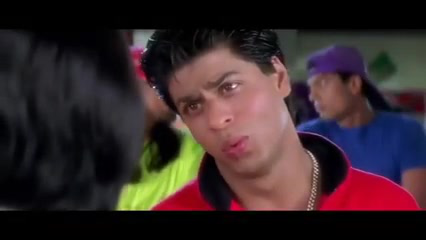

The above image most likely belongs to kiss with a 92.91 percent confidence.


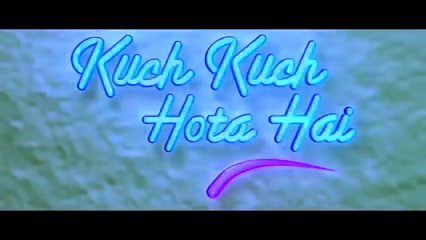

The above image most likely belongs to highfive with a 84.96 percent confidence.


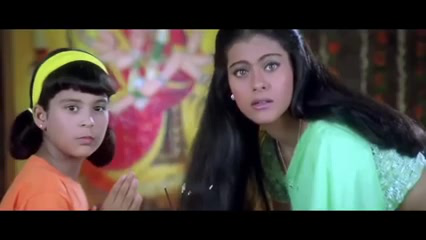

The above image most likely belongs to highfive with a 81.46 percent confidence.


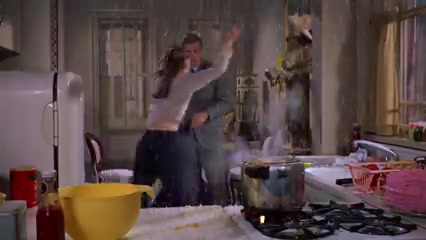

The above image most likely belongs to highfive with a 77.72 percent confidence.


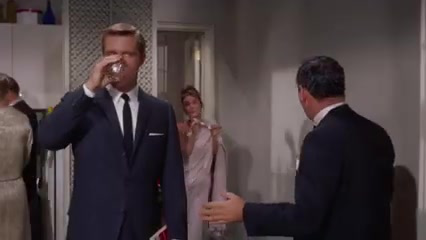

The above image most likely belongs to handshake with a 91.44 percent confidence.


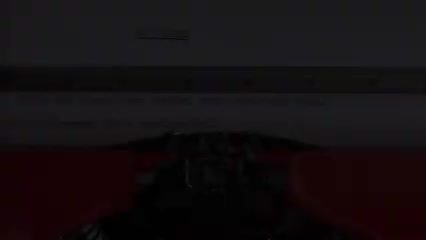

The above image most likely belongs to kiss with a 72.23 percent confidence.


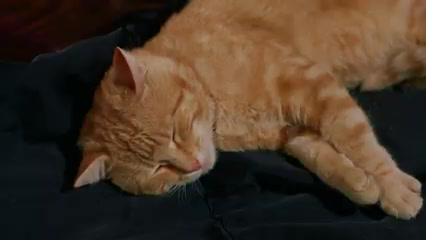

The above image most likely belongs to kiss with a 72.69 percent confidence.


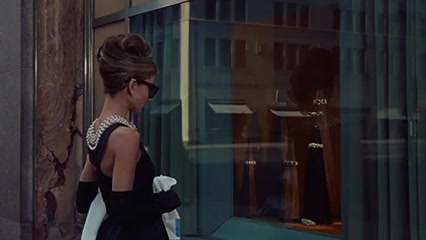

The above image most likely belongs to handshake with a 86.07 percent confidence.


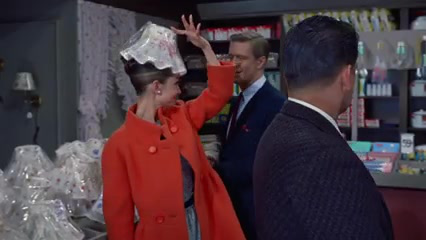

The above image most likely belongs to highfive with a 79.91 percent confidence.


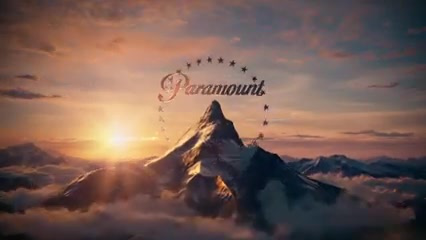

The above image most likely belongs to kiss with a 79.02 percent confidence.


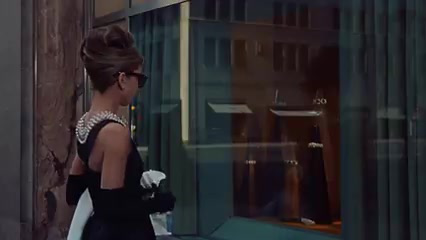

The above image most likely belongs to handshake with a 88.55 percent confidence.


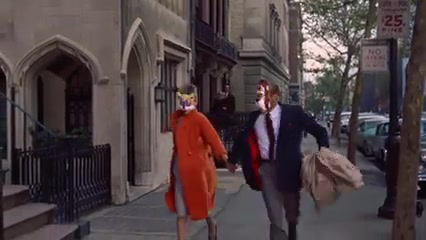

The above image most likely belongs to highfive with a 77.80 percent confidence.


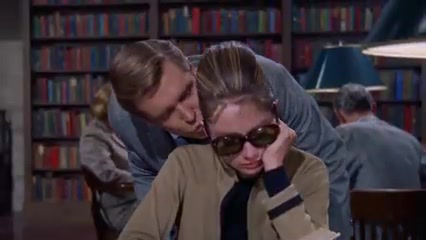

The above image most likely belongs to hug with a 70.32 percent confidence.


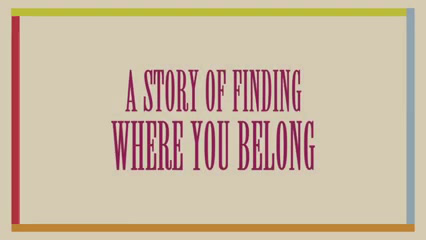

The above image most likely belongs to handshake with a 72.13 percent confidence.


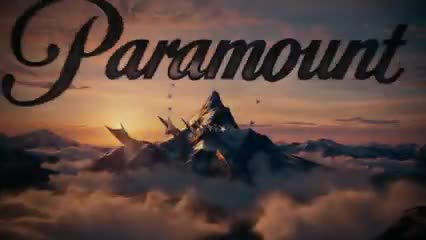

The above image most likely belongs to highfive with a 77.31 percent confidence.


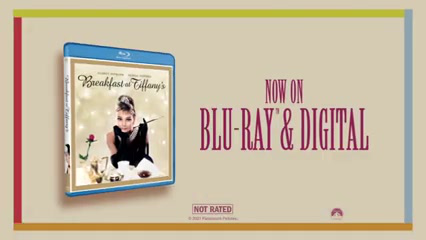

The above image most likely belongs to handshake with a 88.64 percent confidence.


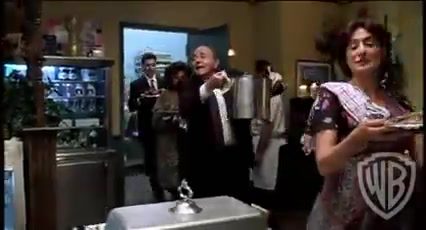

The above image most likely belongs to highfive with a 84.07 percent confidence.


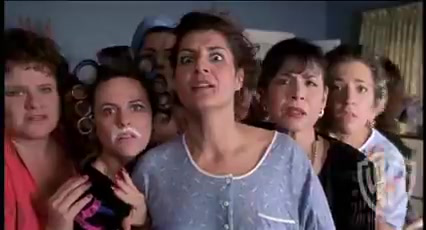

The above image most likely belongs to highfive with a 80.74 percent confidence.


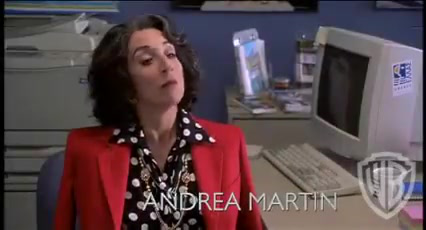

The above image most likely belongs to highfive with a 82.79 percent confidence.


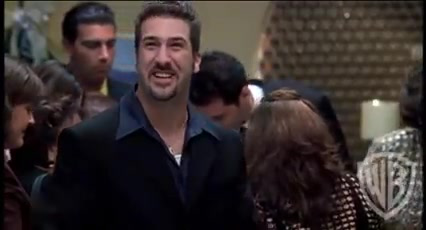

The above image most likely belongs to handshake with a 76.71 percent confidence.


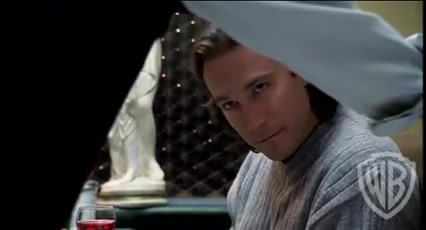

The above image most likely belongs to kiss with a 74.90 percent confidence.


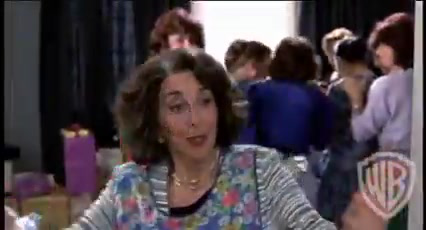

The above image most likely belongs to highfive with a 75.17 percent confidence.


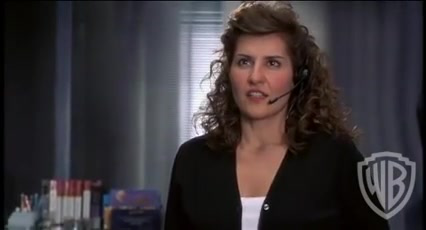

The above image most likely belongs to kiss with a 70.70 percent confidence.


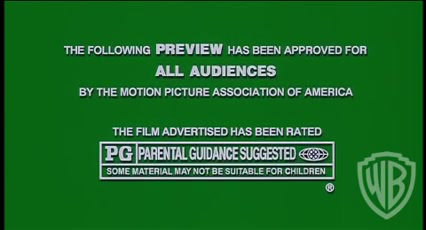

The above image most likely belongs to highfive with a 88.23 percent confidence.


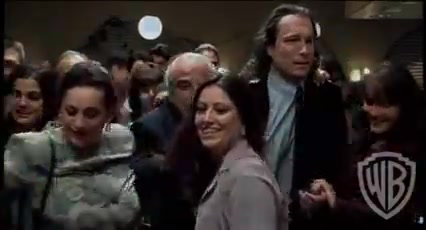

The above image most likely belongs to highfive with a 93.67 percent confidence.


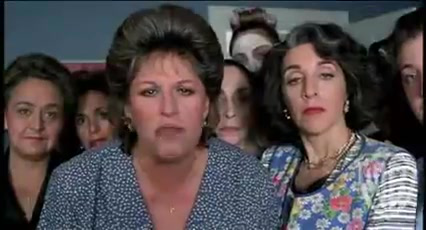

The above image most likely belongs to highfive with a 84.78 percent confidence.


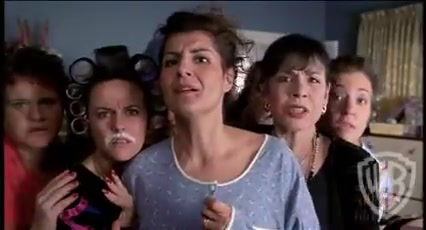

The above image most likely belongs to highfive with a 80.31 percent confidence.


In [ ]:
if_iteration = 0
con_list = []
label_list = []
frames_to_certify = 100 #number of frames you want to see get confidence checked (will be used to break if loop below)
for p in paths: #for loop will go through every path 
  img = tf.keras.utils.load_img(
      p, target_size=(img_height, img_width)
  )
  
  img_array = tf.keras.utils.img_to_array(img)
  img_array = tf.expand_dims(img_array, 0) 
  
  predictions = model.predict(img_array)
  score = tf.nn.softmax(predictions[0])
  threshold = 70 #minimum percentage of confidence you want when displaying the image
  confidence = 100 * np.max(score) #confidence score
  label = class_names[np.argmax(score)]
  con_list.append(confidence) #storing confidence score in list
  label_list.append(label) #storing confidence score in list

  
  if confidence >= threshold: #if confidence is above threshold
    im = Image.open(p) #ONLY then show the image
    im.show() #need to display image
    display(im) #needed to display image

    print(
        "The above image most likely belongs to {} with a {:.2f} percent confidence." #above added to indicate where the image is
        .format(class_names[np.argmax(score)], 100 * np.max(score))
    )
    if_iteration = if_iteration + 1
    #print(if_iteration)    
    if if_iteration > frames_to_certify:
      break
  

In [ ]:
con_c = np.asarray(con_list)
lab_c = np.asarray(label_list)
#confidence scores in array
scores_arr = np.column_stack((con_c, lab_c))

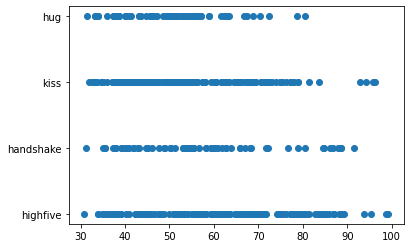

In [ ]:
import matplotlib.pyplot as plt
plt.scatter(con_c, lab_c)
#plot from confidence scores

In [ ]:
#array of confidence scores for quick viewing
print(scores_arr.shape)
scores_arr

(534, 2)


array([['48.72388541698456', 'highfive'],
       ['78.20460796356201', 'highfive'],
       ['54.668694734573364', 'handshake'],
       ...,
       ['37.281206250190735', 'hug'],
       ['55.189311504364014', 'handshake'],
       ['80.3081214427948', 'highfive']], dtype='<U32')

In [ ]:
#@title Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.